In [4]:
import sys
sys.path.append('method_features_extraction/')
import features_extractor as fe
import image_processing as ip
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import resize
from skimage.filters import threshold_otsu, try_all_threshold, threshold_mean
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

%matplotlib inline
plt.rcParams['figure.figsize'] = (20, 20)

skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


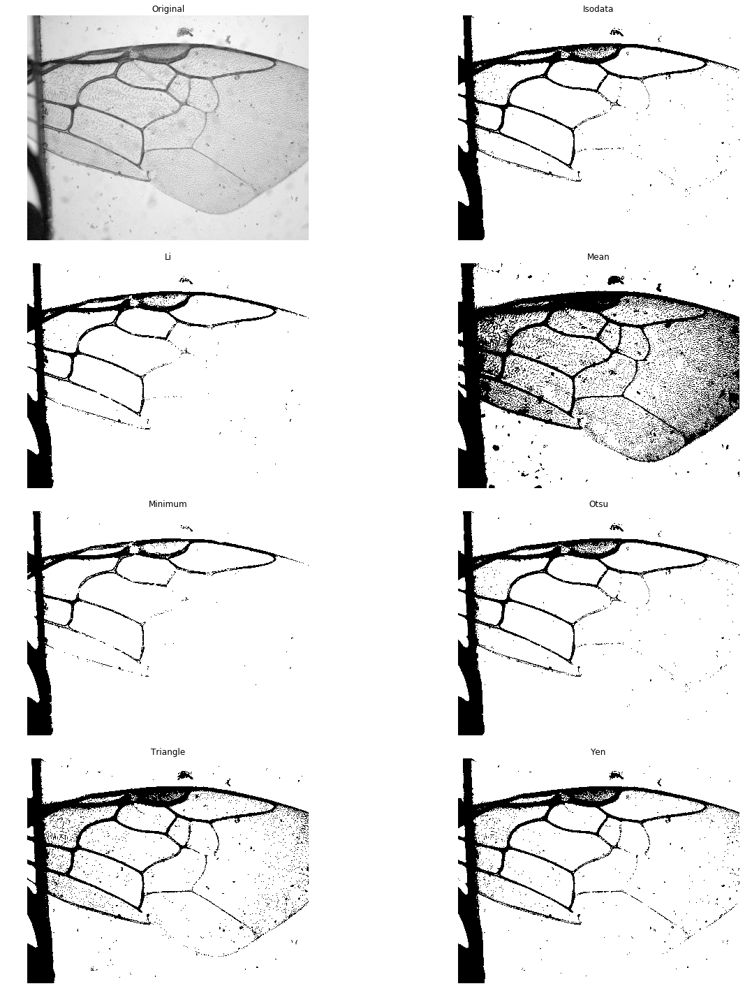

In [49]:
image_rgb = imread('training/raw_images/47 Lasioglossum nymphaerum f right 4x.jpg')
image_rgb = resize(image_rgb, (1600, 2000))
image_gray = rgb2gray(image_rgb)
thresh = threshold_otsu(image_gray)
binaries = try_all_threshold(image_gray, figsize=(20, 20))



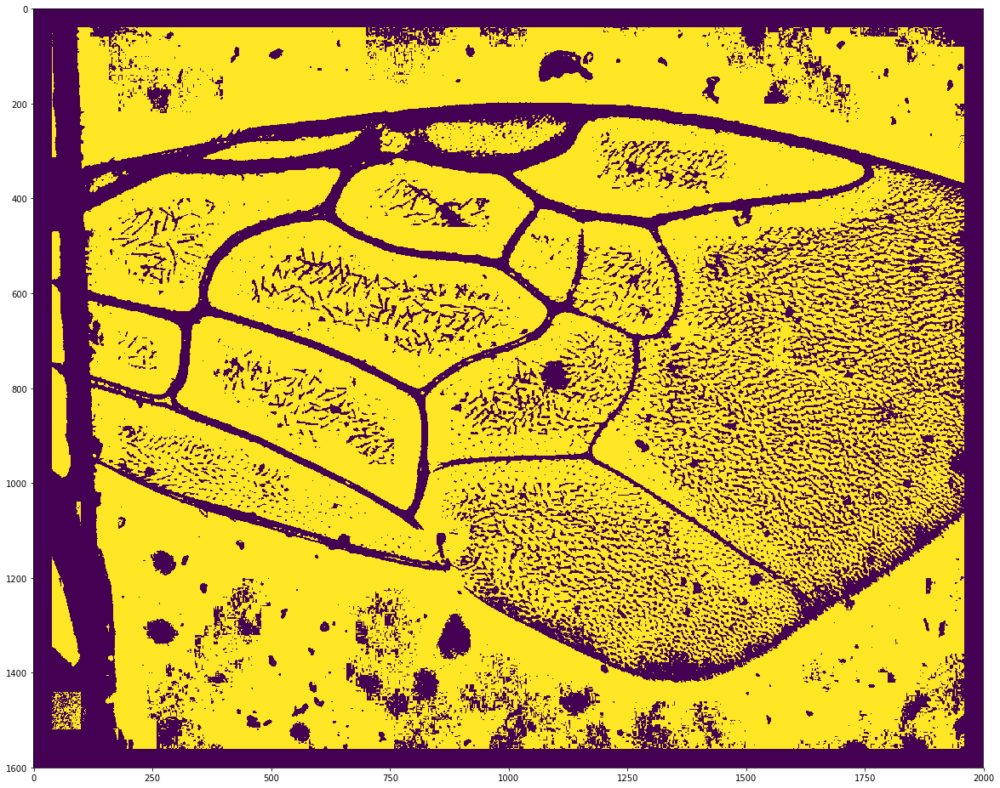

In [50]:
blocks = ip.block_binarization(image_gray)

plt.imshow(blocks)

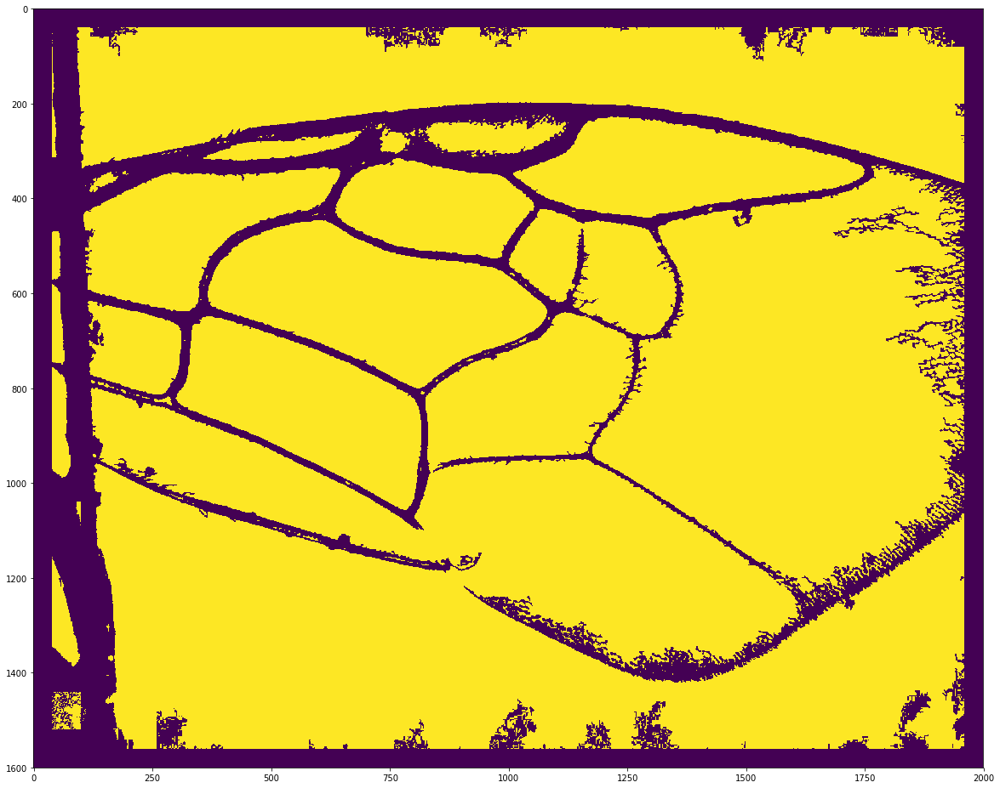

In [75]:
cleared = ip.clear_binary(blocks)
plt.imshow(cleared)

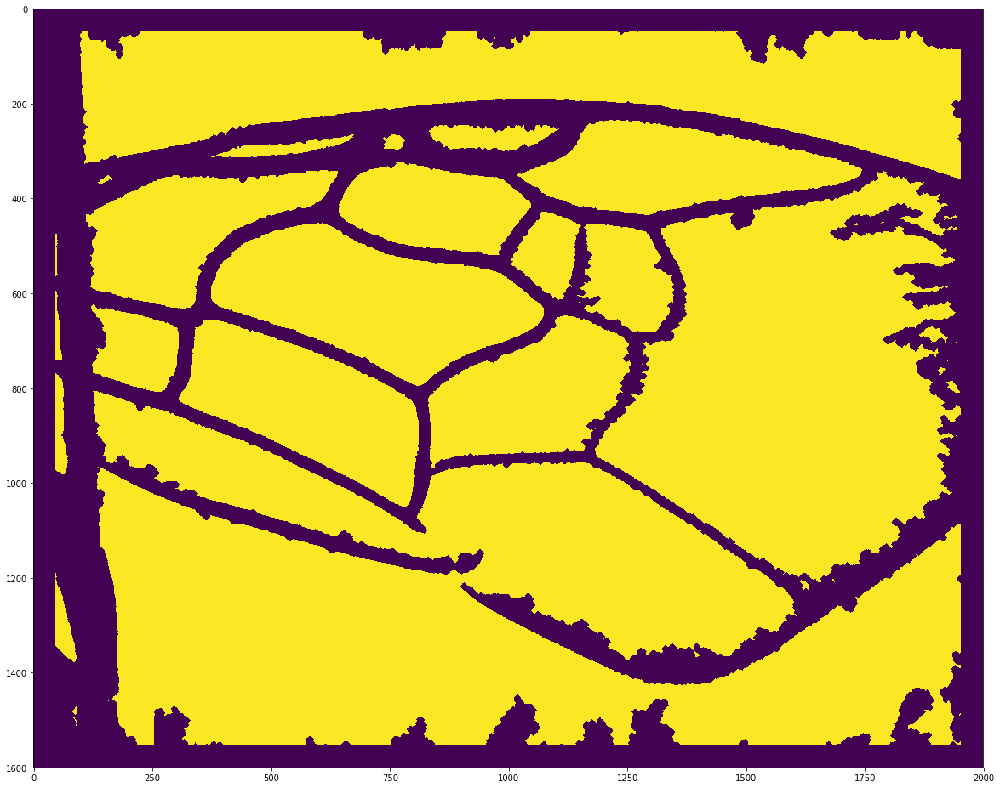

In [76]:
cleared = ndi.binary_erosion(cleared, iterations=6)
plt.imshow(cleared)

/home/theo/anaconda3/lib/python3.6/site-packages/skimage/util/arraycrop.py:177: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = ar[slices]


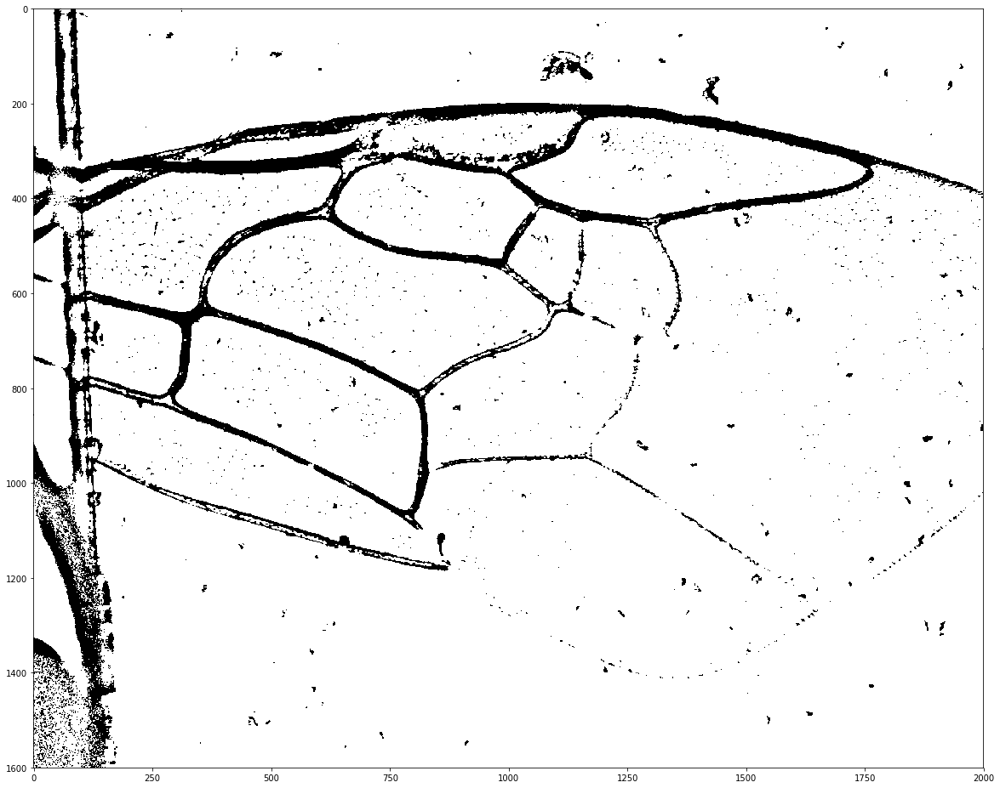

In [53]:
from skimage.filters import threshold_sauvola

sauvola = threshold_sauvola(image_gray, window_size=61)
bin_sauv = image_gray > sauvola
plt.imshow(bin_sauv, plt.cm.gray)

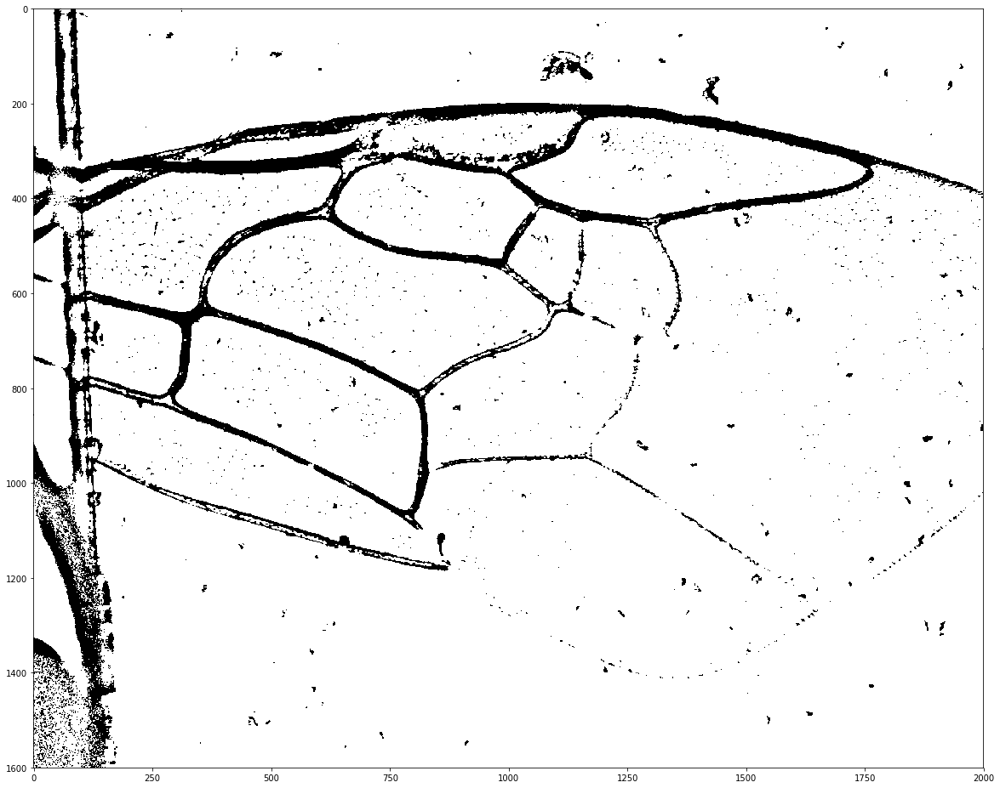

In [54]:
from skimage.filters import threshold_niblack

niblack = threshold_sauvola(image_gray, window_size=61)
bin_nib = image_gray > niblack
plt.imshow(bin_nib, plt.cm.gray)

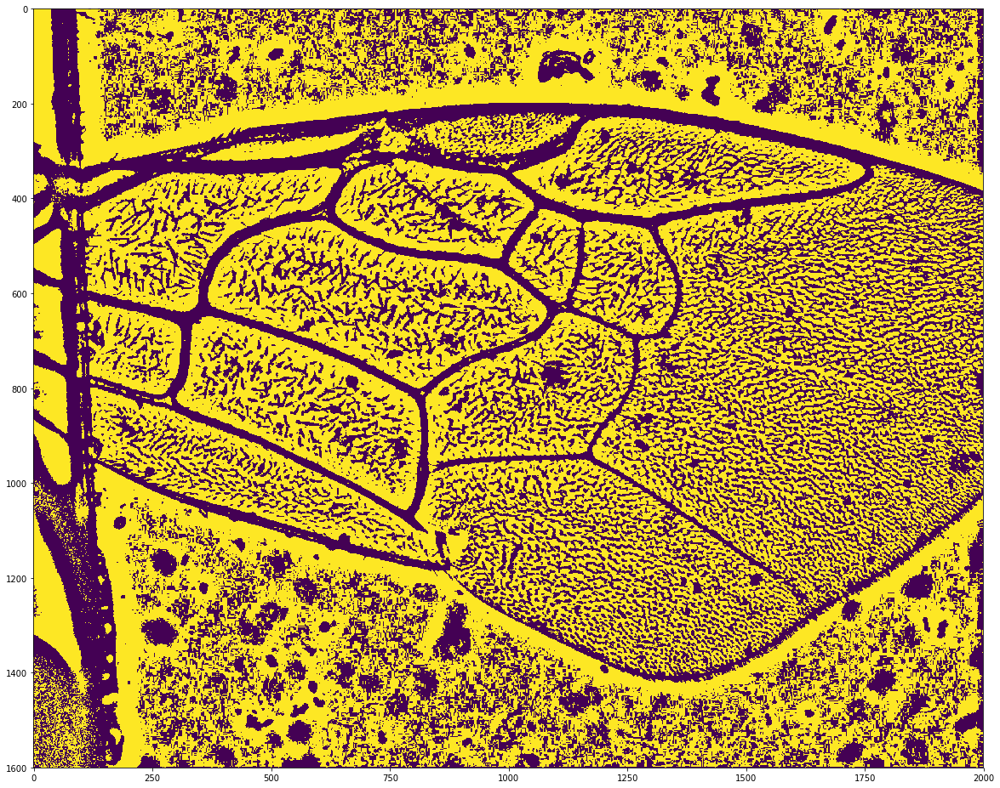

In [55]:
from skimage.filters import threshold_local

thresh = threshold_local(image_gray, block_size=101)
binary = image_gray > thresh
plt.imshow(binary)

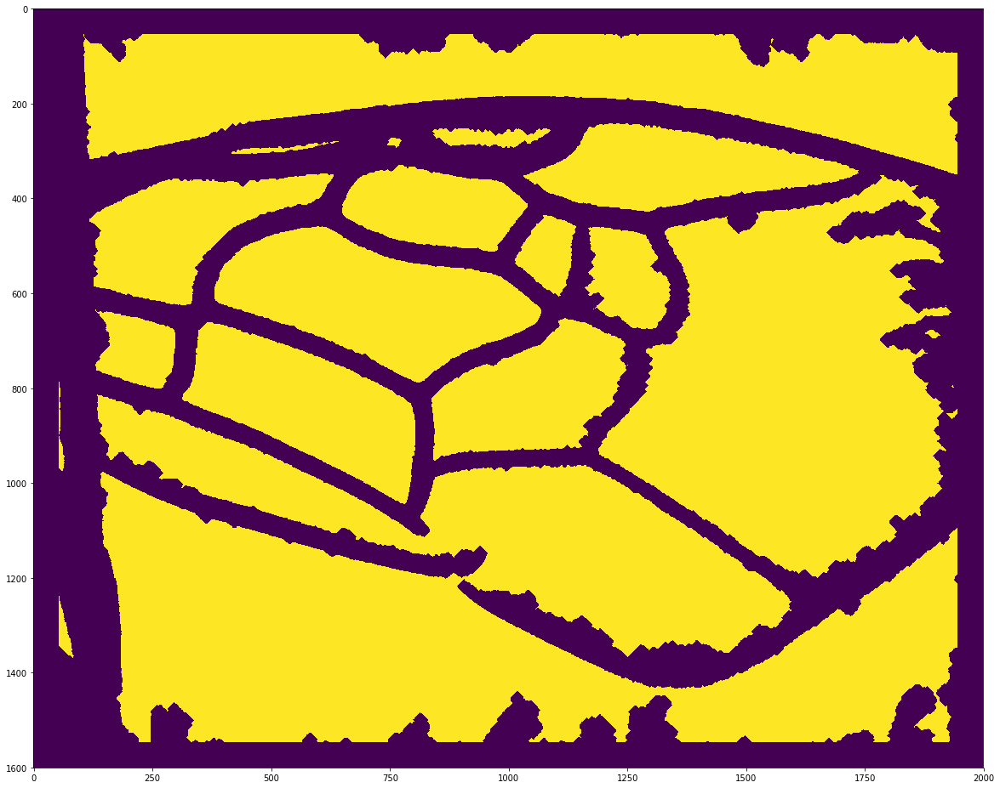

In [70]:
cleared2 = ip.clear_binary(binary)
cleared2 = ndi.binary_erosion(cleared, iterations=8)
plt.imshow(cleared2)

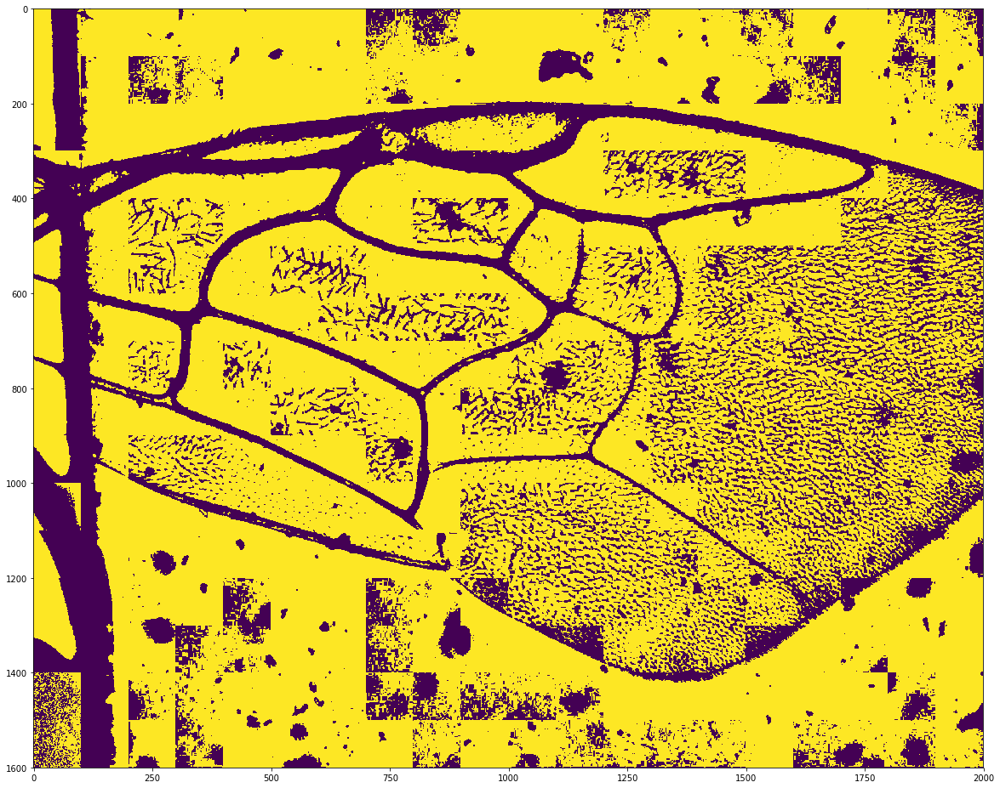

In [77]:
sub = ip.sub_block_binarization(image_gray)
plt.imshow(sub)

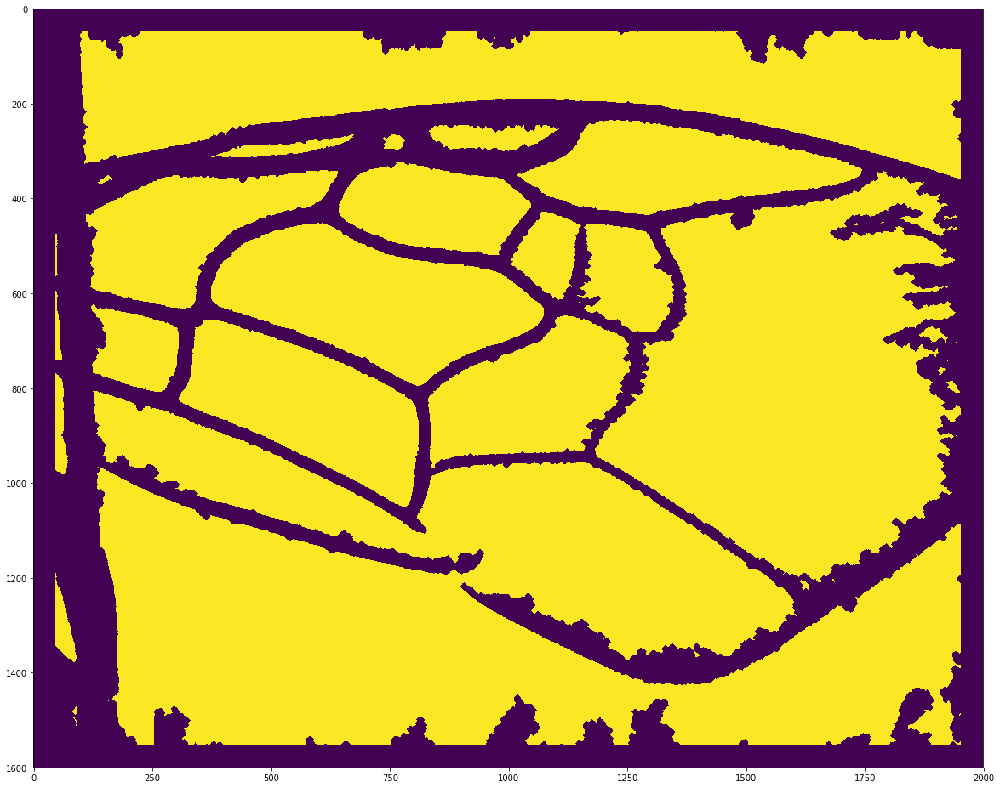

In [78]:
plt.imshow(cleared)

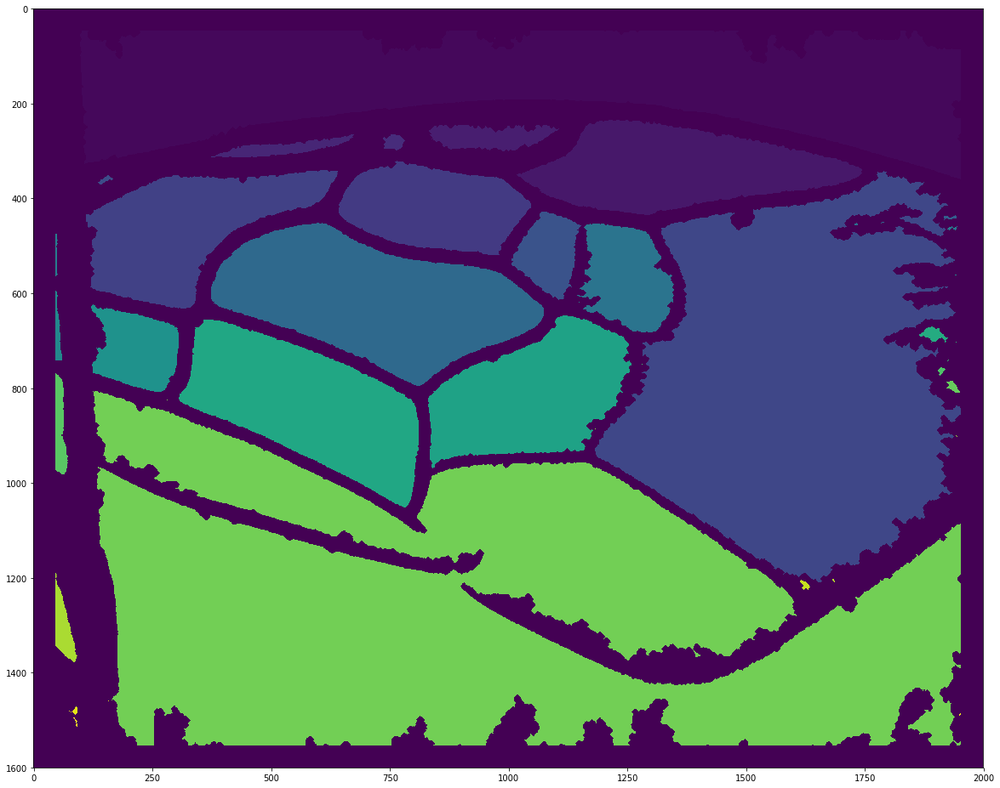

In [79]:
markers, _ = ndi.label(cleared, structure=ndi.generate_binary_structure(2, 2))
plt.imshow(markers)

# Filter and label lasted 0.0971s


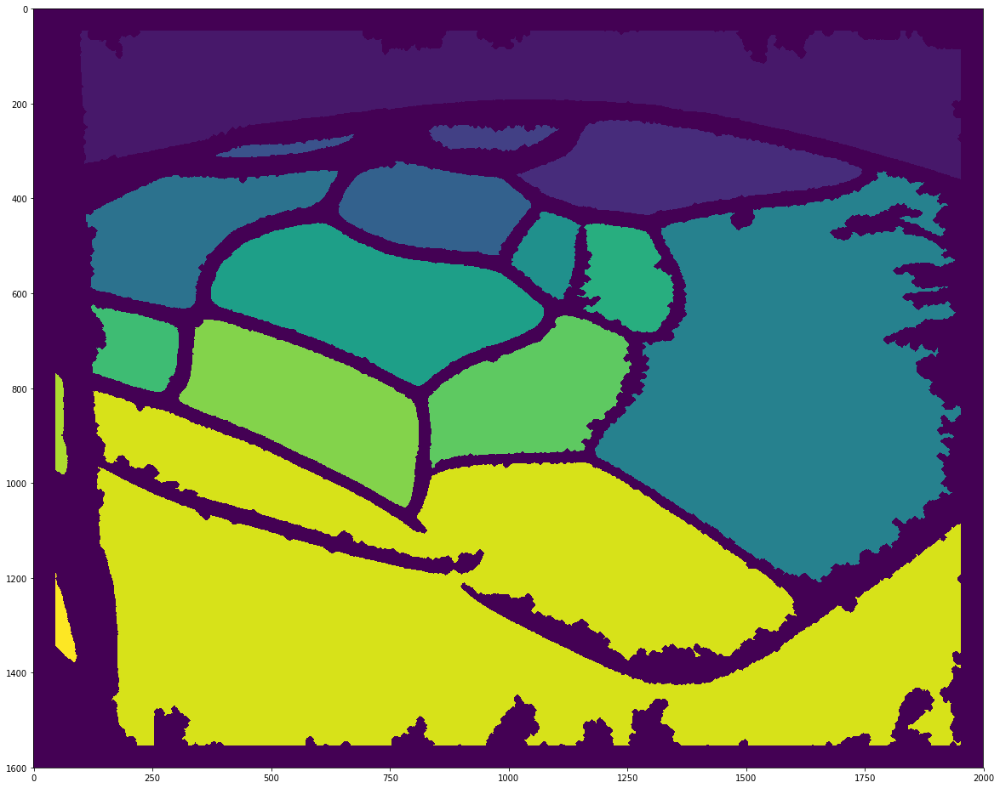

In [80]:
import numpy as np

markers , _= ip.filter_and_label(markers)
markers = np.array(markers)
plt.imshow(markers)

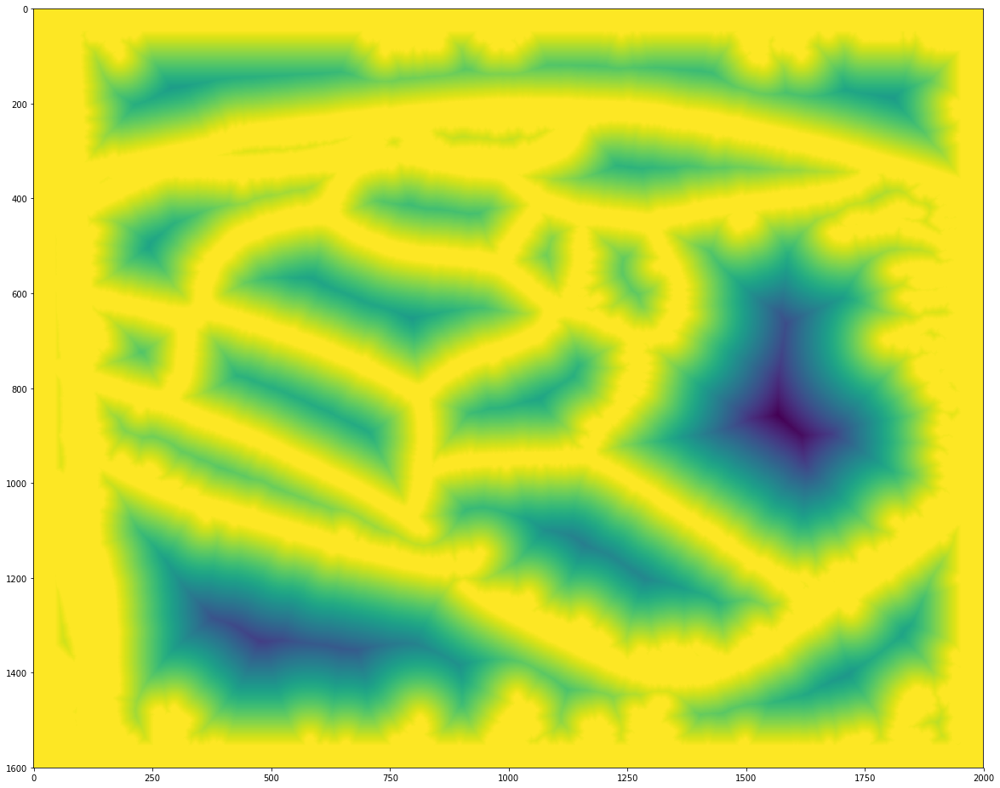

In [81]:
distances = ndi.distance_transform_edt(cleared)
plt.imshow(-distances)

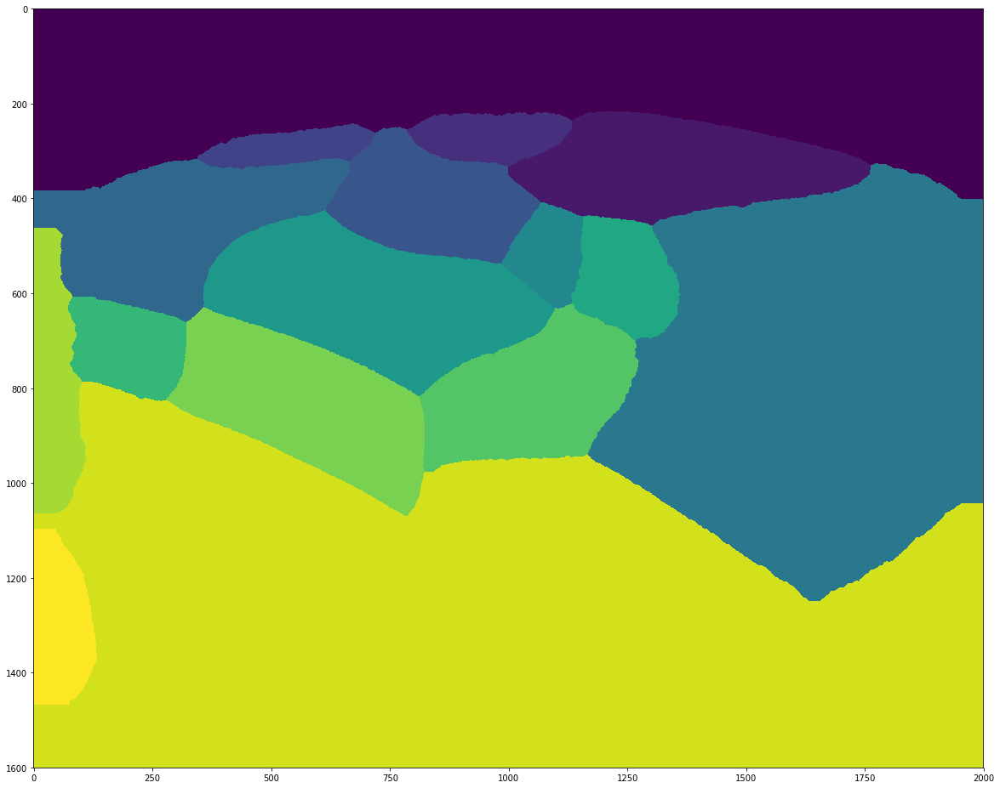

In [82]:
from skimage.morphology import watershed

wat = watershed(-distances, markers)
plt.imshow(wat)

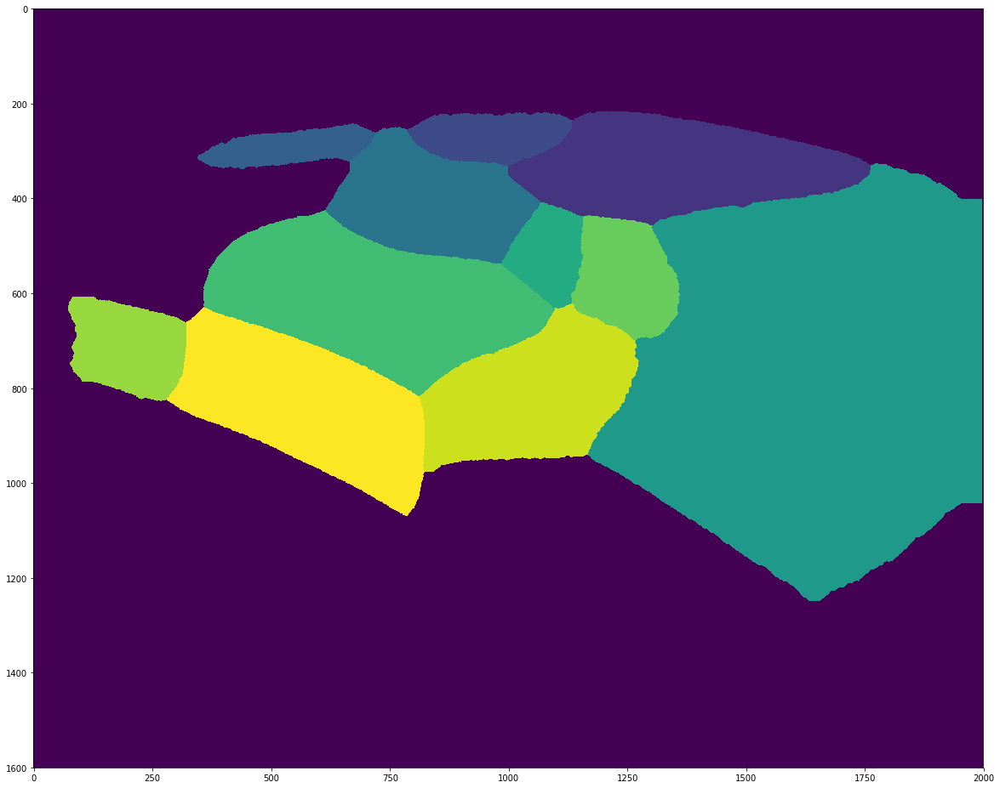

In [83]:
from skimage.segmentation import clear_border

#wat[0,:] = 0
wat[:, -1] = 0
#wat[:, 0] = 0
no_bord = clear_border(wat)
# print(no_bord[600:610, 600: 610])
# no_bord = resize(no_bord, (1600, 2000))
# print(no_bord[600:610, 600: 610])
# print(no_bord.shape)
plt.imshow(no_bord)


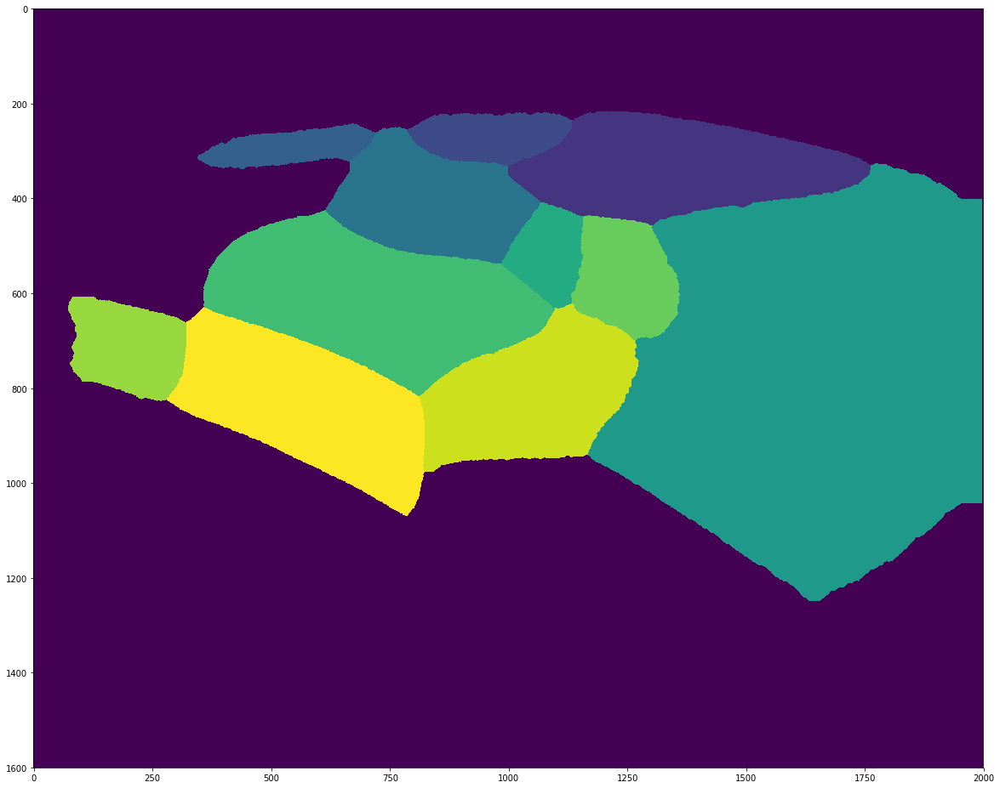

In [84]:
from skimage.color import label2rgb
# no_bord = np.array(no_bord).astype(int)
# type(no_bord[0,0])
# no_bord = resize(no_bord, (1600, 2000))
plt.imshow(no_bord)

# Update image label lasted 0.0347s
# Plotting lasted 0.6692s


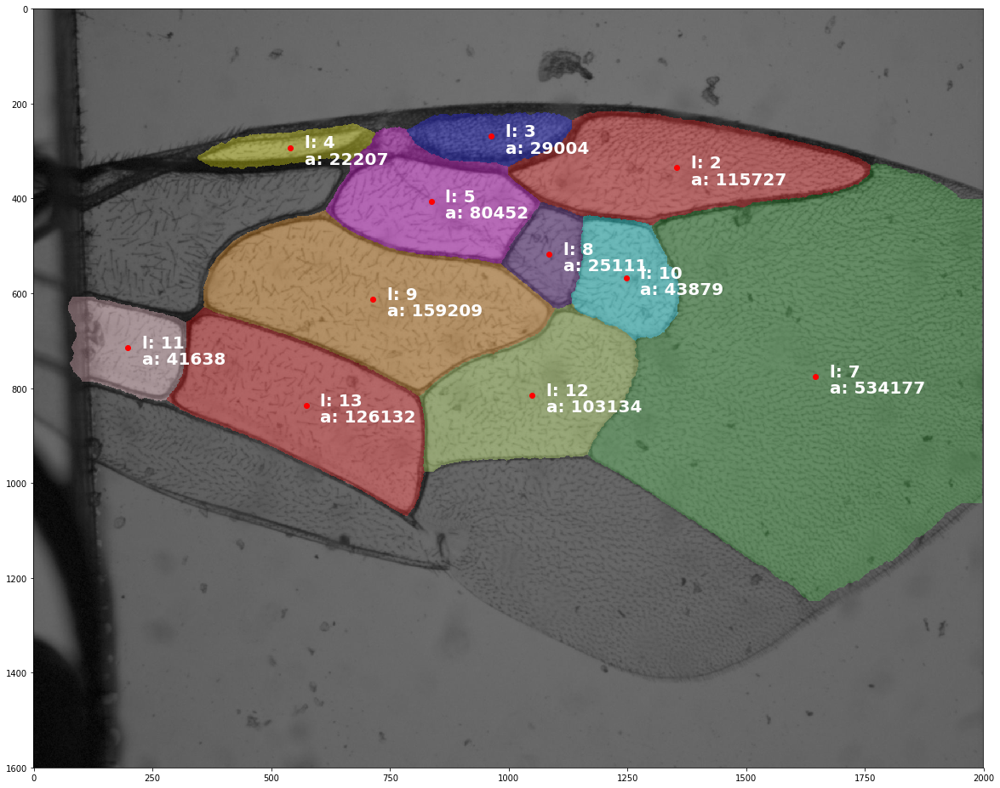

In [109]:
import image_processing as ip
from skimage.transform import resize

#no_bord = np.array(no_bord).astype(int)
#no_bord = resize(no_bord, (1600, 2000))
#print(no_bord[600:610, 600: 610])
rs = ip.region_sorter(no_bord, 'filename')
fig, ax = plt.subplots()
rs.plot(image_gray, ax, 20)

# Filter area lasted 0.0s
# Update image label lasted 0.0215s
# Plotting lasted 0.7001s


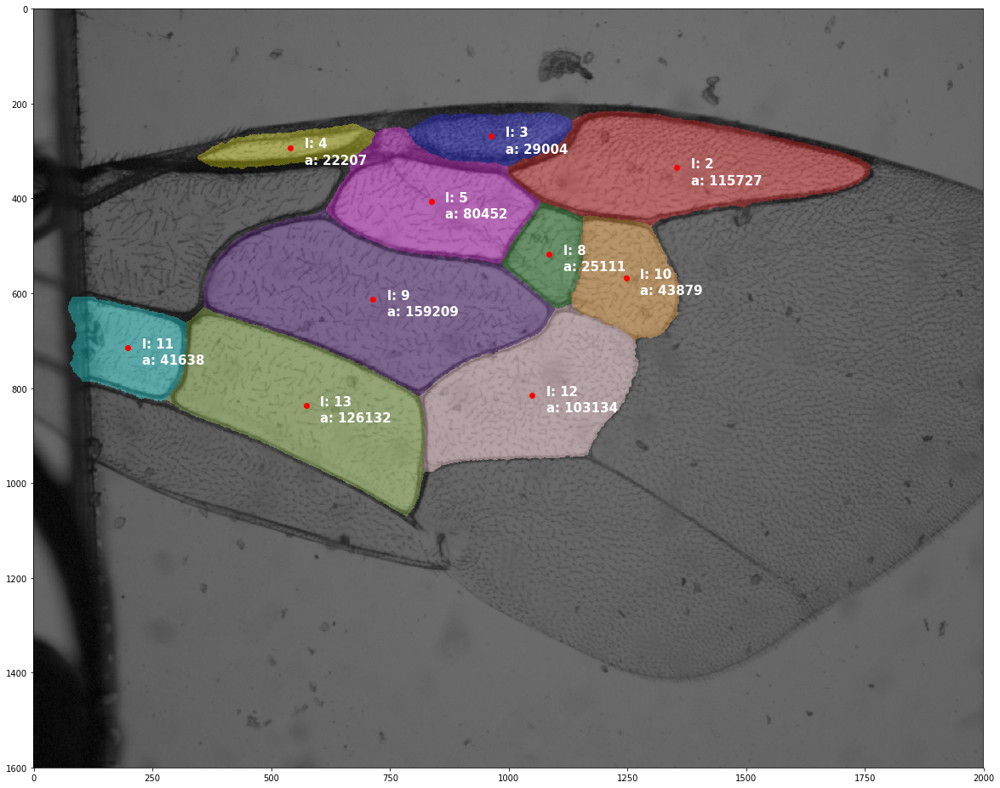

In [110]:
min_area, max_area = 11000, 300000
rs.filter_area(min_area, max_area)
fig, ax = plt.subplots()
rs.plot(image_gray, ax, 15)

# Update image label lasted 0.0311s
# Find neighbors lasted 1.7112s
# Filter neighbors lasted 0.0001s
# Update image label lasted 0.0262s
# Plotting lasted 0.6142s


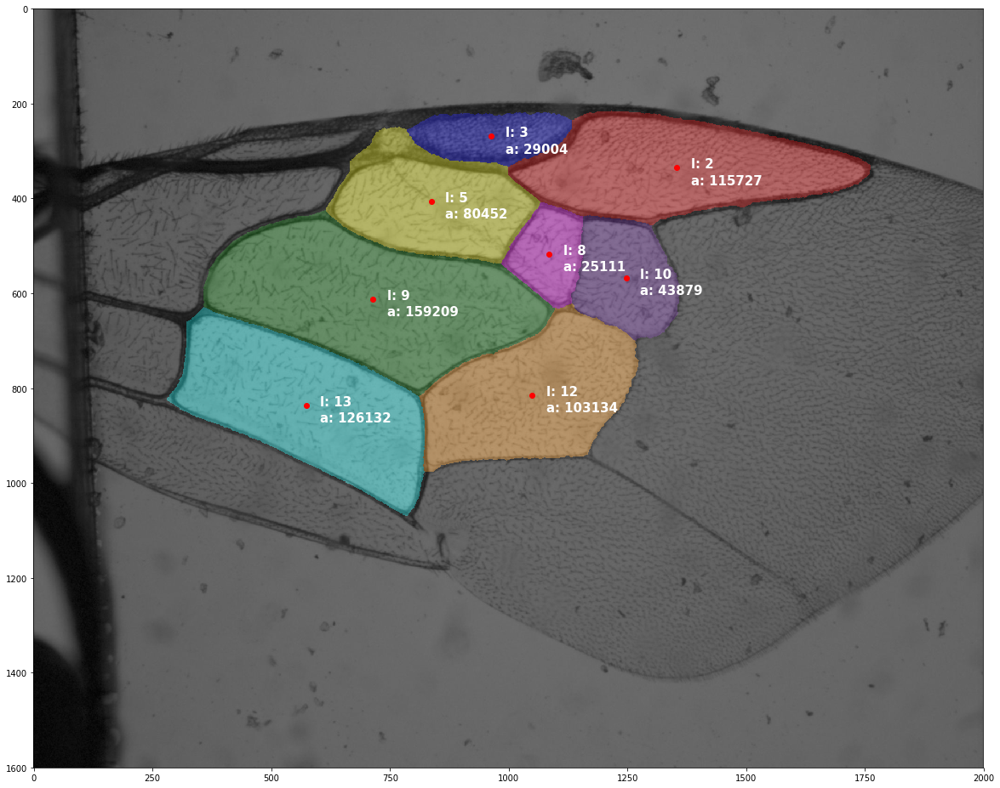

In [111]:
rs.find_neighbors()
rs.filter_neighbors()
fig, ax = plt.subplots()
rs.plot(image_gray, ax, 15)

# Update image label lasted 0.0162s
# Plotting lasted 0.6345s


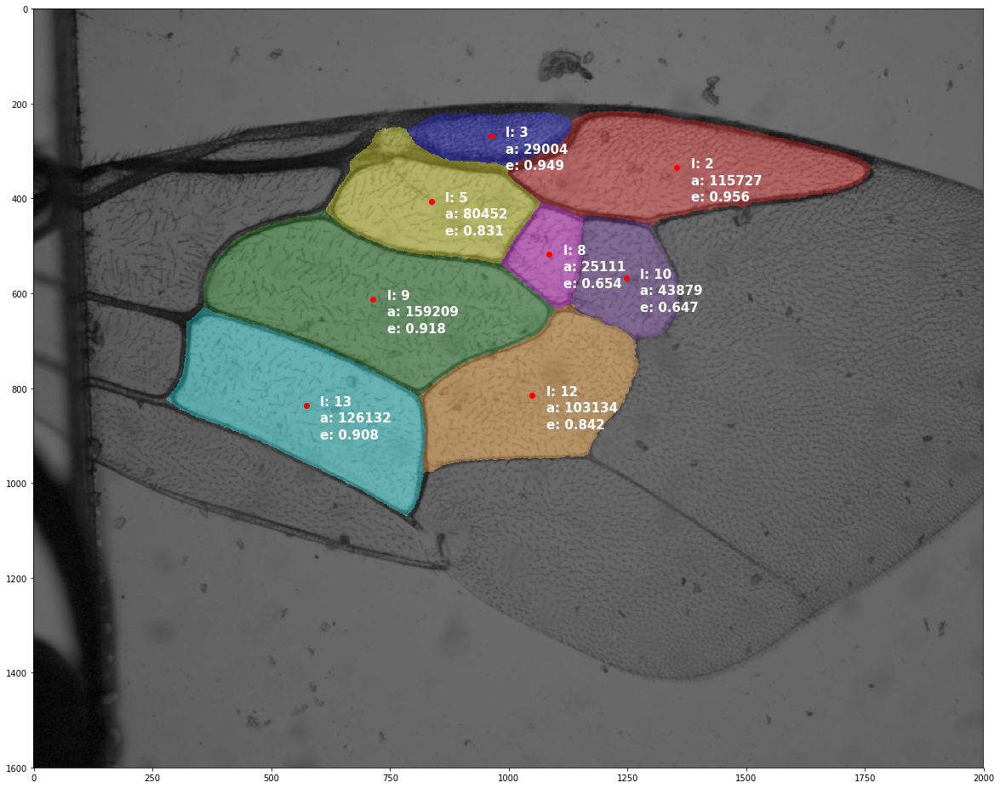

In [112]:
rs.compute_eccentricities()
fig, ax = plt.subplots()
rs.plot(image_gray, ax, 15)

# Finding central cell lasted 0.0001s
# Update image label lasted 0.0257s
# Plotting lasted 0.806s


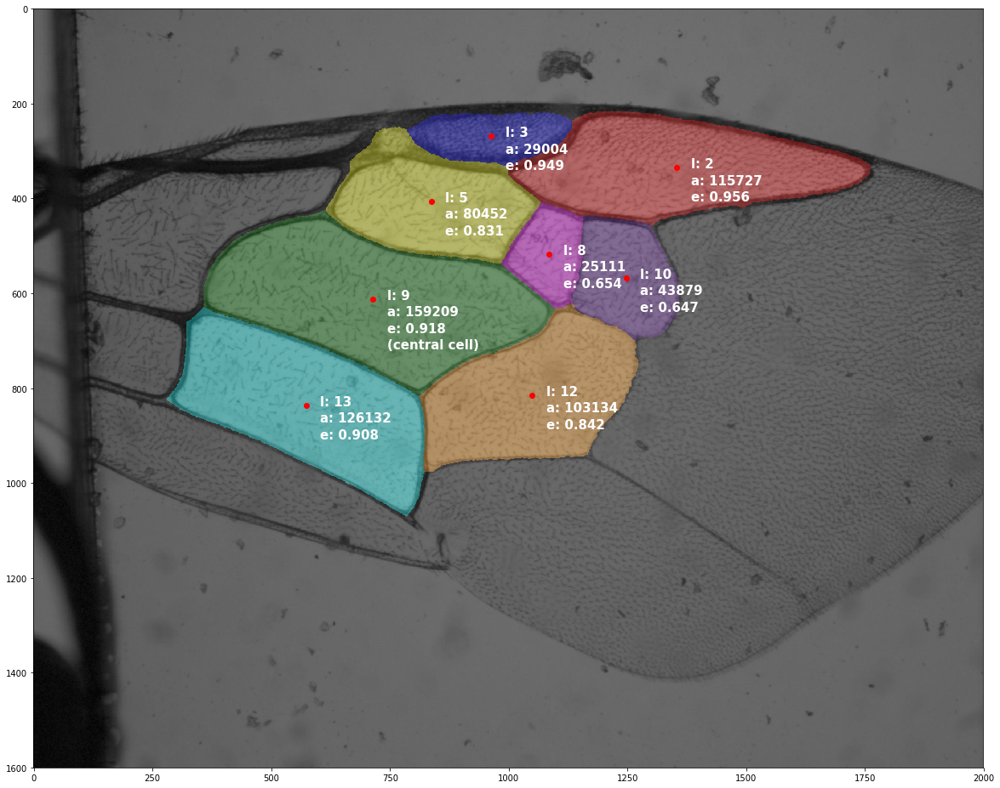

In [113]:
rs.find_central_cell()
fig, ax = plt.subplots()
rs.plot(image_gray, ax, 15)

# Compute angles lasted 0.0002s
# Update image label lasted 0.0247s
# Plotting lasted 0.8042s


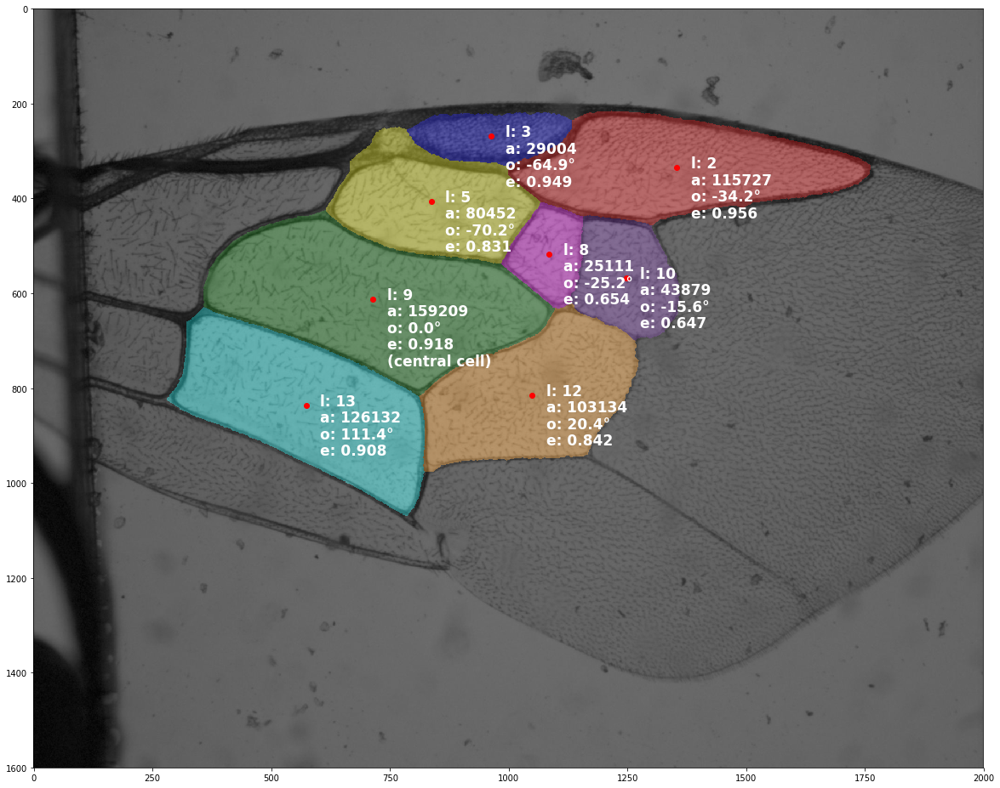

In [114]:
rs.compute_angles()
fig, ax = plt.subplots()
rs.plot(image_gray, ax, 17)

# Filter angles lasted 0.0s
# Update image label lasted 0.017s
# Plotting lasted 0.6169s


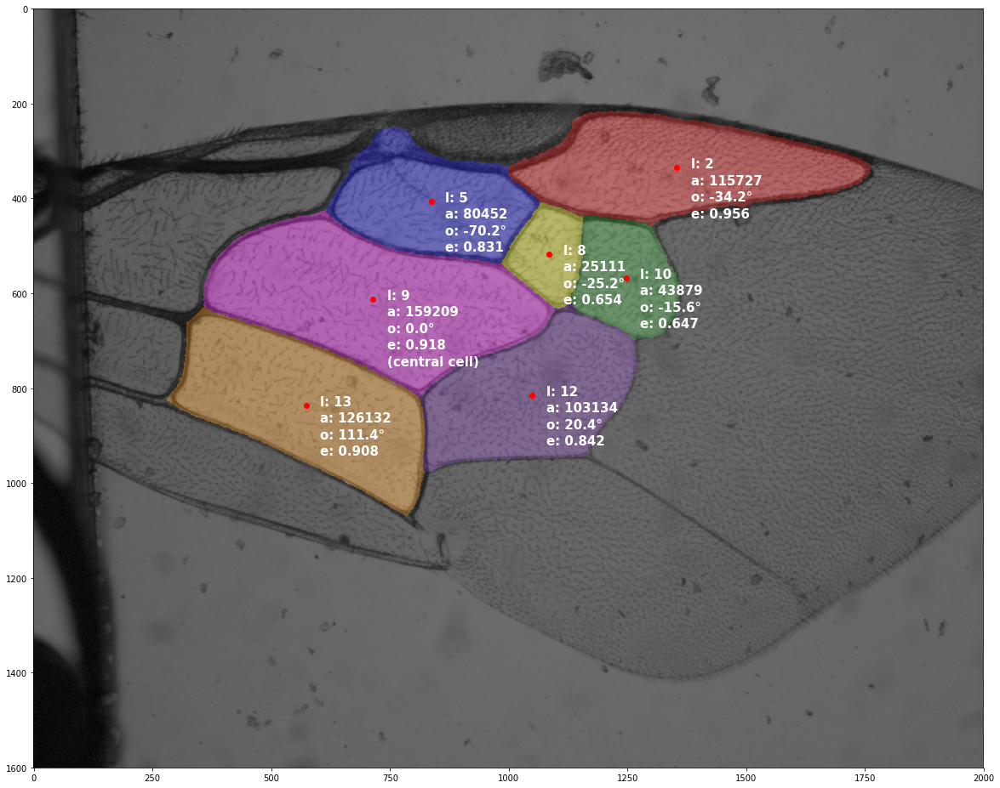

In [115]:
rs.filter_angles()
fig, ax = plt.subplots()
rs.plot(image_gray, ax, 15)

# Identifying regions lasted 0.0s
# Update image label lasted 0.0235s
# Plotting lasted 0.6686s


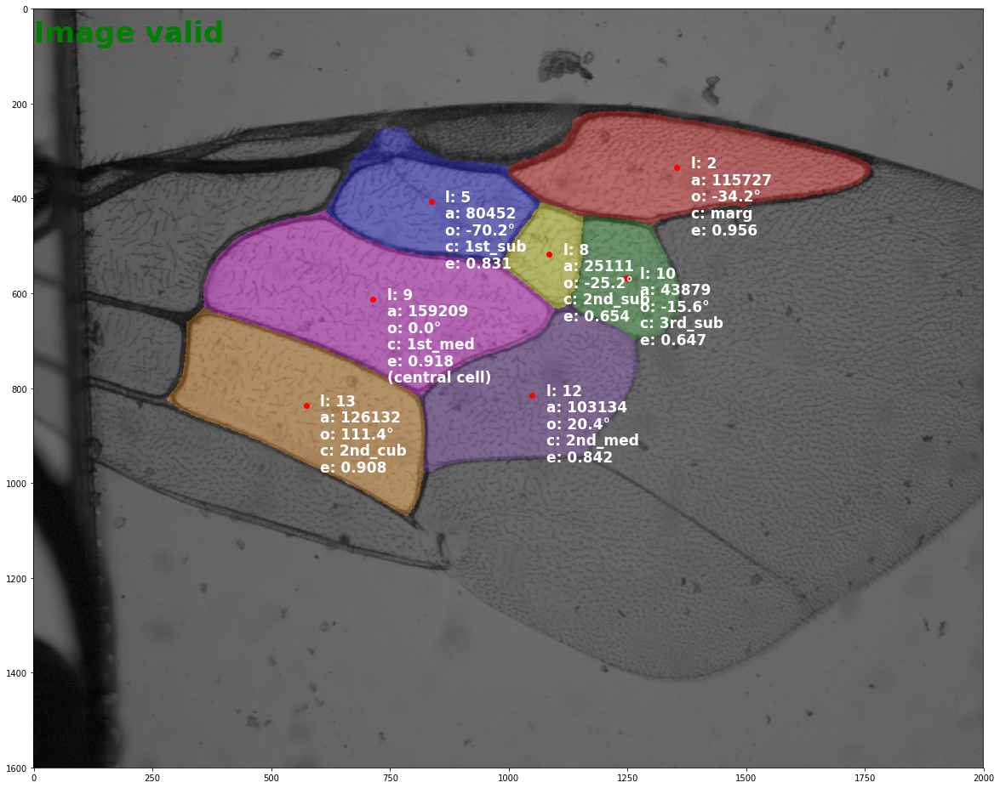

In [116]:
rs.identify_regions()
fig, ax = plt.subplots()
rs.plot(image_gray, ax, 17)

In [120]:
print('lol')


lol


In [129]:
from keras.models import load_model
path = 'method_features_extraction/classifiers/models_ann/species_7cells_ann_model.h5'
path = 'method_cnn/models/VGG16_2nd_method_dataug_110epft20ep.h5'
model = load_model(path)

model.layers[0].summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
__________